In [1]:
import pandas as pd
import numpy as np
import umap
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.cluster import KMeans
from wordcloud import WordCloud

In [2]:
df=pd.read_csv('dataset.csv')
df.head()

,Heading,Body,URL
0,free speech not hate speech madras high court ...,madras high court issue significant remark ami...,https://www.indiatoday.in/law/high-courts/stor...
1,comment take context say us cop mock indian st...,seattle police officer guild friday come defen...,https://www.indiatoday.in/world/story/indian-s...
2,first meeting one nation one election committe...,first official meeting one nation one election...,https://www.indiatoday.in/india/story/one-nati...
3,us airlines flight depressurize midair plummet...,united airlines jet head rome turn around less...,https://www.indiatoday.in/world/story/us-fligh...
4,terrorist kill security force foil infiltratio...,three terrorist kill infiltration bid foil sec...,https://www.indiatoday.in/india/story/one-terr...


In [3]:
df.shape

(11583, 3)

In [4]:
corpus=list(df['Heading'])

In [5]:
corpus[8775]

'switch shoe quota kota'

In [6]:
corpus_embeddings=np.load('embeddings_headings.npy')

In [7]:
print(corpus_embeddings.shape)

(11583, 768)


In [9]:
# reduce the size of the embeddings using UMAP
reduced_embeddings = umap.UMAP(n_components=2, n_neighbors=100, min_dist=0.02).fit_transform(corpus_embeddings)
print(reduced_embeddings.shape)

# put the values of the two dimensions inside the dataframe
df["x"] = reduced_embeddings[:, 0]
df["y"] = reduced_embeddings[:, 1]

# substring of the full text, for visualization purposes
df["text_short"] = df["Heading"].str[:100]

C:\Users\prish\anaconda3\envs\clus\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


(11583, 2)


In [10]:
reduced_embeddings

array([[ 1.7462509 , -3.4662342 ],
       [ 1.7758336 , -2.309311  ],
       [ 2.6744292 , -5.5180035 ],
       ...,
       [ 2.4725263 , -4.748142  ],
       [-0.37358084, -0.89893717],
       [ 1.2351333 , -3.6596098 ]], shape=(11583, 2), dtype=float32)

In [11]:
# scatter plot
hover_data = {
    "text_short": True,
    "x": False,
    "y": False
}
fig = px.scatter(df, x="x", y="y", template="plotly_dark",
                   title="Embeddings", hover_data=hover_data)
fig.update_layout(showlegend=False)
fig.show()

In [12]:
num_clusters=10
clustering_model=KMeans(n_clusters=num_clusters)
clustering_model.fit(reduced_embeddings)
cluster_assignment=clustering_model.labels_

In [13]:
cluster_assignment

array([3, 3, 2, ..., 2, 4, 3], shape=(11583,), dtype=int32)

In [14]:
cluster_df = pd.DataFrame(corpus, columns = ['corpus'])
cluster_df['cluster'] = cluster_assignment
cluster_df.head()

,corpus,cluster
0,free speech not hate speech madras high court ...,3
1,comment take context say us cop mock indian st...,3
2,first meeting one nation one election committe...,2
3,us airlines flight depressurize midair plummet...,1
4,terrorist kill security force foil infiltratio...,6


In [15]:
desired_cluster = 0
selected_df = cluster_df[cluster_df['cluster'] == desired_cluster]
selected_df.head(15)

,corpus,cluster
30,indian school need encourage entrepreneurship,0
41,inflation keep policymaker guess impact festiv...,0
52,tamil nadu telangana launch breakfast scheme s...,0
68,india raise windfall tax petroleum crude rs tonne,0
69,sensex nifty hit fresh lifetime high,0
71,gold silver price today september precious met...,0
72,nifty sensex hit fresh record high strong chin...,0
73,india release wheat stock reduce price ahead f...,0
75,sensex nifty end higher market sentiment remai...,0
78,india wholesale inflation contract august,0


In [16]:
selected_df.shape

(1386, 2)

In [17]:
def word_cloud(pred_df,label):
    wc = ' '.join([text for text in pred_df['corpus'][pred_df['cluster'] == label]])
    wordcloud = WordCloud(width=800, height=500,
    random_state=21, max_font_size=110).generate(wc)
    fig7 = plt.figure(figsize=(10, 7))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')

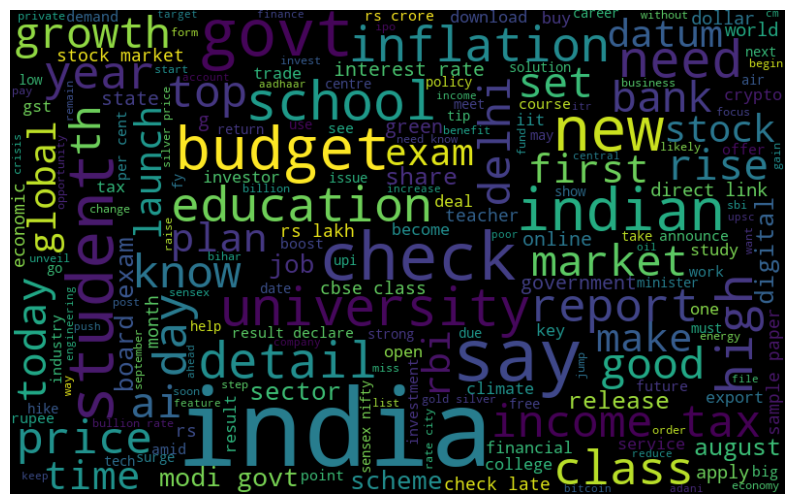

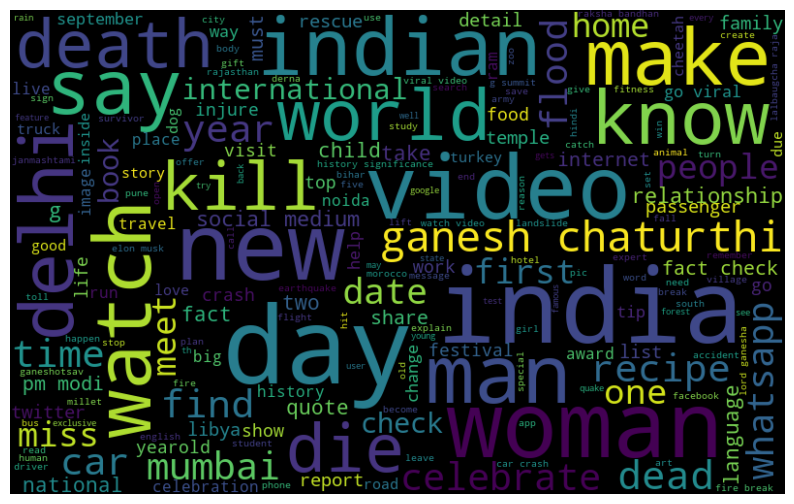

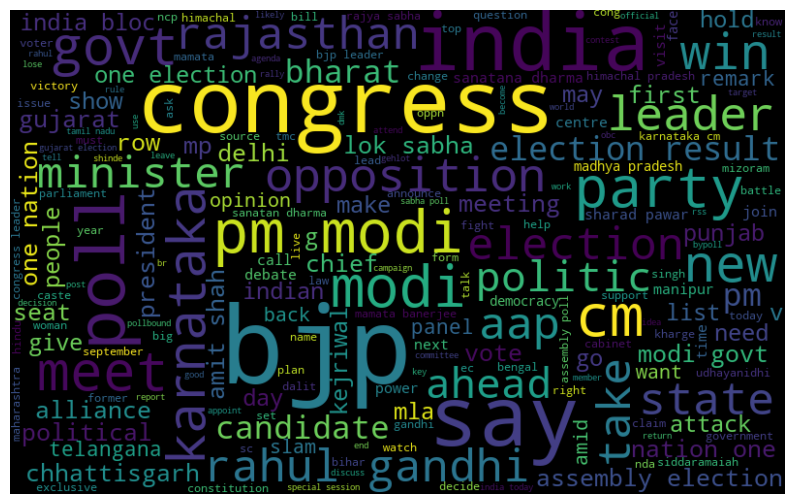

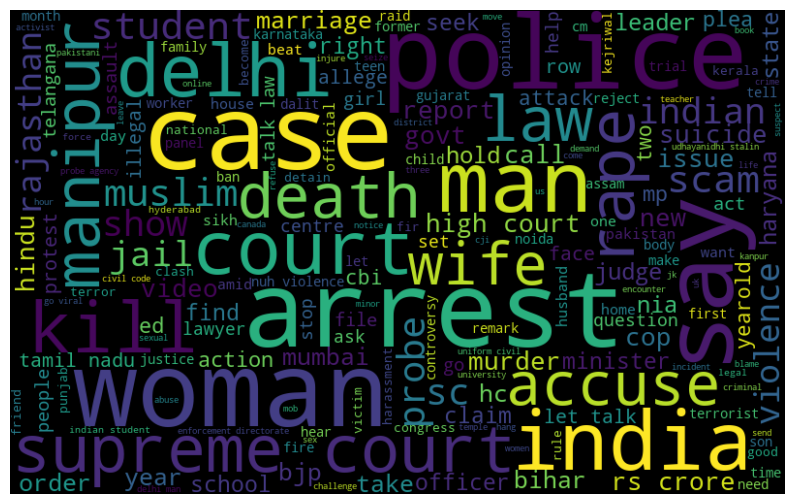

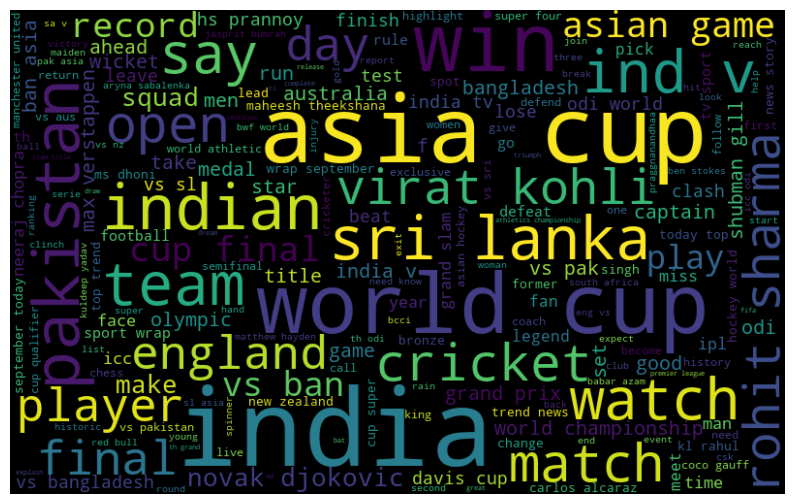

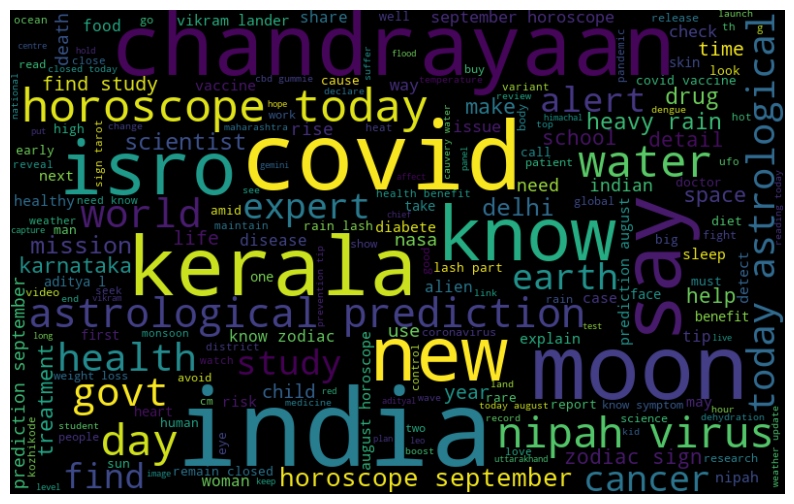

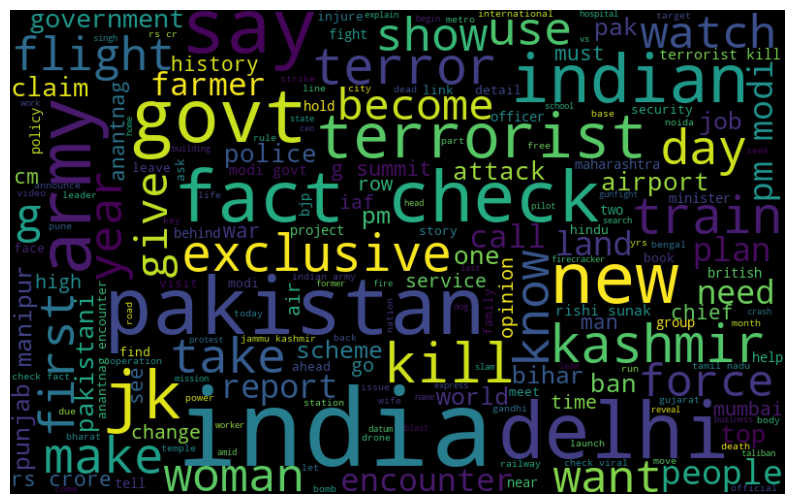

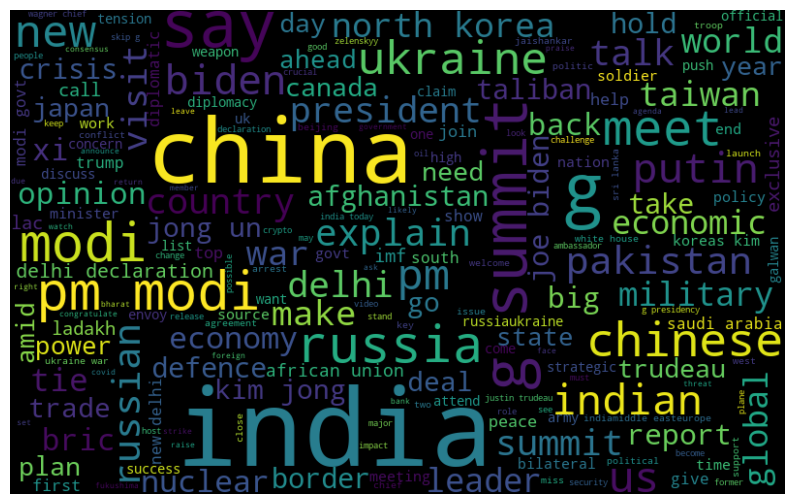

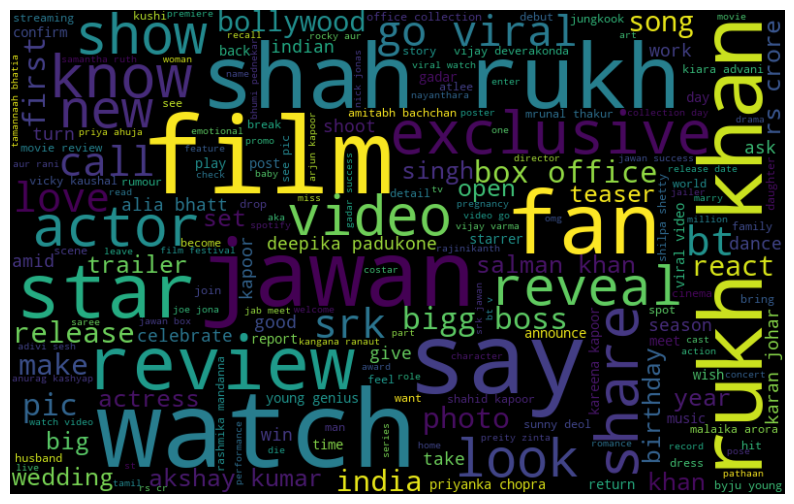

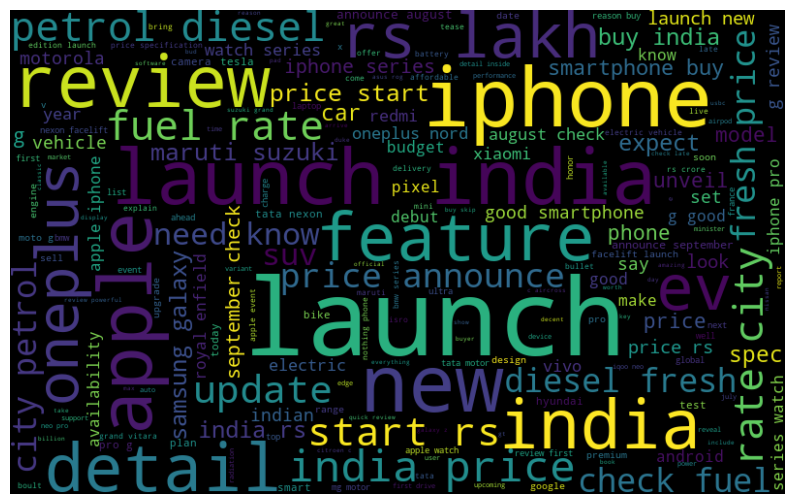

In [18]:
for i in range(10):
    word_cloud(cluster_df,i)

In [19]:
def categorize(label):
    if label==3:
        return 'Judiciary'
    elif label==9:
        return 'Entertainment'
    elif label==4:
        return 'Science'
    elif label==5:
        return 'Sports'
    elif label==8:
        return 'Politics'
    elif label==0:
        return 'International'
    elif label==7:
        return 'Technology'
    elif label==2:
        return 'Business'
    elif label==1:
        return 'Culture'
    elif label==6:
        return 'Crime'
    else:
        return label

In [20]:
cluster_df['Body']=df['Body']
cluster_df.head()

,corpus,cluster,Body
0,free speech not hate speech madras high court ...,3,madras high court issue significant remark ami...
1,comment take context say us cop mock indian st...,3,seattle police officer guild friday come defen...
2,first meeting one nation one election committe...,2,first official meeting one nation one election...
3,us airlines flight depressurize midair plummet...,1,united airlines jet head rome turn around less...
4,terrorist kill security force foil infiltratio...,6,three terrorist kill infiltration bid foil sec...


In [21]:
cluster_df['Category'] = cluster_df['cluster'].apply(categorize)
pd.unique(cluster_df['Category'])

array(['Judiciary', 'Business', 'Culture', 'Crime', 'Sports', 'Politics',
       'Science', 'Technology', 'International', 'Entertainment'],
      dtype=object)

In [22]:
cluster_df.head()

,corpus,cluster,Body,Category
0,free speech not hate speech madras high court ...,3,madras high court issue significant remark ami...,Judiciary
1,comment take context say us cop mock indian st...,3,seattle police officer guild friday come defen...,Judiciary
2,first meeting one nation one election committe...,2,first official meeting one nation one election...,Business
3,us airlines flight depressurize midair plummet...,1,united airlines jet head rome turn around less...,Culture
4,terrorist kill security force foil infiltratio...,6,three terrorist kill infiltration bid foil sec...,Crime


In [23]:
del cluster_df['cluster']
cluster_df.head()

,corpus,Body,Category
0,free speech not hate speech madras high court ...,madras high court issue significant remark ami...,Judiciary
1,comment take context say us cop mock indian st...,seattle police officer guild friday come defen...,Judiciary
2,first meeting one nation one election committe...,first official meeting one nation one election...,Business
3,us airlines flight depressurize midair plummet...,united airlines jet head rome turn around less...,Culture
4,terrorist kill security force foil infiltratio...,three terrorist kill infiltration bid foil sec...,Crime


In [24]:
cluster_df.rename(columns={'corpus': 'Heading'}, inplace=True)
cluster_df.head()

,Heading,Body,Category
0,free speech not hate speech madras high court ...,madras high court issue significant remark ami...,Judiciary
1,comment take context say us cop mock indian st...,seattle police officer guild friday come defen...,Judiciary
2,first meeting one nation one election committe...,first official meeting one nation one election...,Business
3,us airlines flight depressurize midair plummet...,united airlines jet head rome turn around less...,Culture
4,terrorist kill security force foil infiltratio...,three terrorist kill infiltration bid foil sec...,Crime


In [25]:
cluster_df['URL']=df['URL']
cluster_df.head()

,Heading,Body,Category,URL
0,free speech not hate speech madras high court ...,madras high court issue significant remark ami...,Judiciary,https://www.indiatoday.in/law/high-courts/stor...
1,comment take context say us cop mock indian st...,seattle police officer guild friday come defen...,Judiciary,https://www.indiatoday.in/world/story/indian-s...
2,first meeting one nation one election committe...,first official meeting one nation one election...,Business,https://www.indiatoday.in/india/story/one-nati...
3,us airlines flight depressurize midair plummet...,united airlines jet head rome turn around less...,Culture,https://www.indiatoday.in/world/story/us-fligh...
4,terrorist kill security force foil infiltratio...,three terrorist kill infiltration bid foil sec...,Crime,https://www.indiatoday.in/india/story/one-terr...


In [26]:
cluster_df.to_csv('labelled.csv', index=False)